In [ ]:
  #Imports
from xml.etree import ElementTree
from xml.dom import minidom
import collections

import os

import matplotlib.pyplot as plt
import matplotlib as matplot
import seaborn as sns
%matplotlib inline


/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [ ]:
ls drive/My\ Drive

'Abhisht Singh (1).pdf'
'Abhisht Singh (2).pdf'
'Abhisht Singh (3).pdf'
 Abhisht_Singh_OS_1810110006.gdoc
'Abhisht Singh.pdf'
'Apogee Draft.gdoc'
'Apogee Email to Rajeev Sir.gdoc'
'Book report.gdoc'
'breeze video '/
 CA2020_Abhisht_Singh.gdoc
'CA Module 4.gdoc'
'CA Presentation.gdoc'
'Case study .gdoc'
 CNS_ASSIGNMENT3_ABHISHT_SINGH.gdoc
'Code-sprint SNU.gdoc'
'Colab Notebooks'/
'College Authorization letter_SIH2020 (1).gdoc'
'College Authorization letter_SIH2020.docx'
'College Authorization letter_SIH2020.gdoc'
'CSD 202 Project Presentation.gslides'
'CV_Resume (1).pdf'
 CV_Resume.pdf
 dataset1.csv
'Design Project.gdoc'
'Dhruva Society'/
'Discrete Mathematics(code).tex'
 DSC_media/
 Dukh/
'EED206 - Group 6A.gslides'
 evshints.gdoc
'EVS QUESTIONS.gdoc'
 Finances.gsheet
 Finances.xlsx
'Getting started.pdf'
 gpio2_1_2.mp4
 gpio2_1.mp4
 gpio.mp4
'Graded Lab Problems.gdoc'
'GSoC Prep.gdoc'
'Hackkrunch Budget Sheet.gsheet'
 HBP:BigBrain_AbhishtSingh_1810110006.gdoc
'HCL Hackathon-Selected Te

In [ ]:
cd content/drive/

In [ ]:
!tar -xvf /content/drive/My\ Drive/SIH_DUKH/dataset_final_0.tar.xz

Streaming output truncated to the last 5000 lines.
labels/train/India_002877.txt
labels/train/India_004005.txt
labels/train/India_005777.txt
labels/train/India_000124.txt
labels/train/India_004705.txt
labels/train/India_003822.txt
labels/train/India_009826.txt
labels/train/India_008842.txt
labels/train/India_001910.txt
labels/train/India_005734.txt
labels/train/India_004366.txt
labels/train/India_007387.txt
labels/train/India_006073.txt
labels/train/India_009550.txt
labels/train/India_001113.txt
labels/train/India_006782.txt
labels/train/India_008308.txt
labels/train/India_003868.txt
labels/train/India_002172.txt
labels/train/India_001208.txt
labels/train/India_008905.txt
labels/train/India_006249.txt
labels/train/India_006696.txt
labels/train/India_004993.txt
labels/train/India_007704.txt
labels/train/India_008207.txt
labels/train/India_003758.txt
labels/train/India_005379.txt
labels/train/India_000826.txt
labels/train/India_003457.txt
labels/train/India_001756.txt
labels/train/India_

In [ ]:
# base_path = os.getcwd() + '/train/India'
damageTypes=["D00", "D01", "D10", "D11", "D20", "D40", "D43", "D44"]


D00 : 1555
D01 : 179
D10 : 68
D11 : 45
D20 : 2021
D40 : 3187
D43 : 57
D44 : 1062


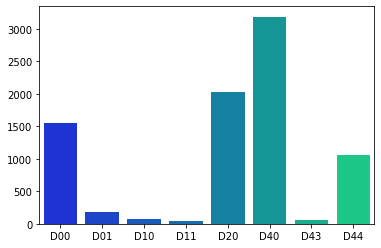

In [ ]:
# IGNORE 
# count_dict = collections.Counter(cls_names)
# cls_count = []
# for damageType in damageTypes:
#     print(str(damageType) + ' : ' + str(count_dict[damageType]))
#     cls_count.append(count_dict[damageType])
    
# sns.set_palette("winter", 8)
# sns.barplot(damageTypes, cls_count)

In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
#temporary until bug is fixed in current master
!git reset --hard 5ba1de0cdcc414c69ceb7a4c45eb1e3895eca32a
%cd /content

!pip install -r yolov5/requirements.txt  # install dependencies
%cd yolov5

import torch
from IPython.display import Image, clear_output  # to display images
from utils.google_utils import gdrive_download  # to download models/datasets

clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.5.1+cu101 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15079MB, multi_processor_count=40)


In [ ]:
!cat /content/data.yaml


train: /content/images/train
val: /content/images/test

nc: 8
names: ["D00", "D01", "D10", "D11", "D20", "D40", "D43", "D44"]

In [ ]:
# define number of classes based on YAML
import yaml
with open("/content/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:

!cat /content/yolov5/models/custom_yolov5l.yaml

cat: /content/yolov5/models/custom_yolov5l.yaml: No such file or directory


In [ ]:
%cd /content/
##write custom model .yaml
#you can configure this based on other YOLOv5 models in the models directory
with open('yolov5/models/yolov5l.yaml', 'w') as f:
  # parameters
  f.write('nc: ' + num_classes + '\n')
  f.write('nc: ' + str(len(class_labels)) + '\n')
  f.write('depth_multiple: 0.33'  + '\n') # model depth multiple
  f.write('width_multiple: 0.50'  + '\n')  # layer channel multiple
  f.write('\n')
  f.write('anchors:' + '\n')
  f.write('  - [10,13, 16,30, 33,23] ' + '\n')
  f.write('  - [30,61, 62,45, 59,119]' + '\n')
  f.write('  - [116,90, 156,198, 373,326] ' + '\n')
  f.write('\n')

  f.write('backbone:' + '\n')
  f.write('  [[-1, 1, Focus, [64, 3]],' + '\n')
  f.write('   [-1, 1, Conv, [128, 3, 2]],' + '\n')
  f.write('   [-1, 3, Bottleneck, [128]],' + '\n')
  f.write('   [-1, 1, Conv, [256, 3, 2]],' + '\n')
  f.write('   [-1, 9, BottleneckCSP, [256]],' + '\n')
  f.write('   [-1, 1, Conv, [512, 3, 2]], ' + '\n')
  f.write('   [-1, 9, BottleneckCSP, [512]],' + '\n')
  f.write('   [-1, 1, Conv, [1024, 3, 2]],' + '\n')
  f.write('   [-1, 1, SPP, [1024, [5, 9, 13]]],' + '\n')
  f.write('   [-1, 6, BottleneckCSP, [1024]],' + '\n')
  f.write('  ]' + '\n')
  f.write('\n')

  f.write('head:'  + '\n')
  f.write('  [[-1, 3, BottleneckCSP, [1024, False]],'  + '\n')
  f.write('   [-1, 1, nn.Conv2d, [na * (nc + 5), 1, 1, 0]],' + '\n')
  f.write('   [-2, 1, nn.Upsample, [None, 2, "nearest"]],' + '\n')
  
  f.write('   [[-1, 6], 1, Concat, [1]],' + '\n')
  f.write('   [-1, 1, Conv, [512, 1, 1]],' + '\n')
  f.write('   [-1, 3, BottleneckCSP, [512, False]],' + '\n')
  f.write('   [-1, 1, nn.Conv2d, [na * (nc + 5), 1, 1, 0]],' + '\n')
  
  f.write('   [-2, 1, nn.Upsample, [None, 2, "nearest"]],' + '\n')
  f.write('   [[-1, 4], 1, Concat, [1]],' + '\n')
  f.write('   [-1, 1, Conv, [256, 1, 1]],' + '\n')
  f.write('   [-1, 3, BottleneckCSP, [256, False]],' + '\n')
  f.write('   [-1, 1, nn.Conv2d, [na * (nc + 5), 1, 1, 0]],' + '\n')
  f.write('\n' )
  f.write('   [[], 1, Detect, [nc, anchors]],' + '\n')
  f.write('  ]' + '\n')

print('custom model config written!')

/content
custom model config written!


In [ ]:
# train yolov5s on custom data for 50 epochs
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 25 --data '../data.yaml' --cfg ./models/custom_yolov5l.yaml --weights '' --name yolov5l_results --nosave --cache

/content/yolov5
Apex recommended for faster mixed precision training: https://github.com/NVIDIA/apex
{'lr0': 0.01, 'momentum': 0.937, 'weight_decay': 0.0005, 'giou': 0.05, 'cls': 0.58, 'cls_pw': 1.0, 'obj': 1.0, 'obj_pw': 1.0, 'iou_t': 0.2, 'anchor_t': 4.0, 'fl_gamma': 0.0, 'hsv_h': 0.014, 'hsv_s': 0.68, 'hsv_v': 0.36, 'degrees': 0.0, 'translate': 0.0, 'scale': 0.5, 'shear': 0.0}
Your branch is behind 'origin/master' by 190 commits, and can be fast-forwarded.
  (use "git pull" to update your local branch)

Namespace(adam=False, batch_size=16, bucket='', cache_images=True, cfg='./models/custom_yolov5l.yaml', data='../data.yaml', device='', epochs=25, evolve=False, img_size=[416], multi_scale=False, name='yolov5l_results', noautoanchor=False, nosave=True, notest=False, rect=False, resume=False, single_cls=False, weights='')
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15079MB)

2020-07-21 17:24:25.782712: I tensorflow/stream_executor/platform/default/dso_loader.

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

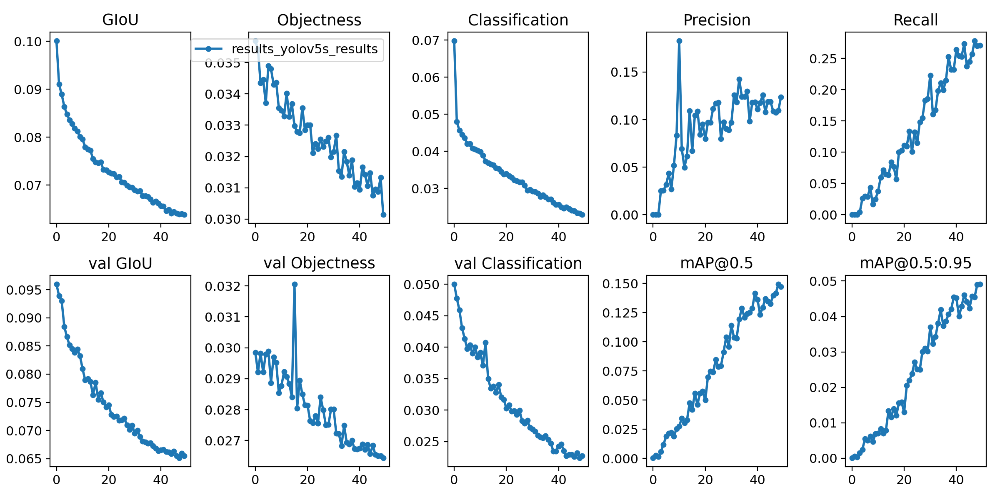

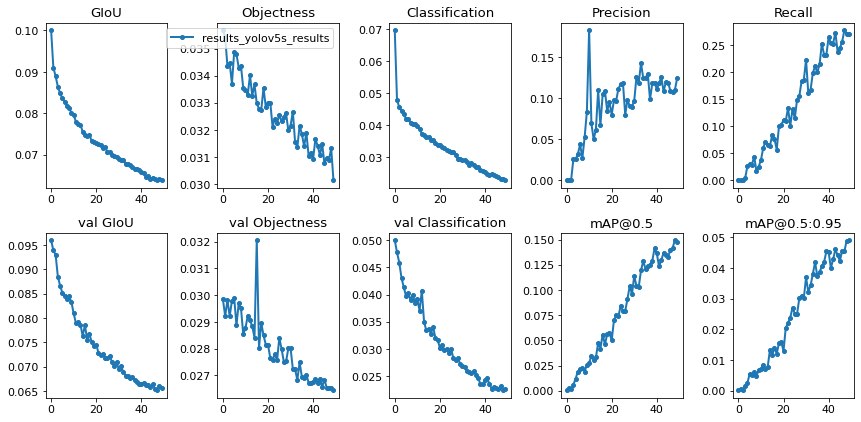

In [ ]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason... 
from utils.utils import plot_results; plot_results()  # plot results.txt as results.png
Image(filename='./results.png', width=1000)  # view results.png

GROUND TRUTH TRAINING DATA:


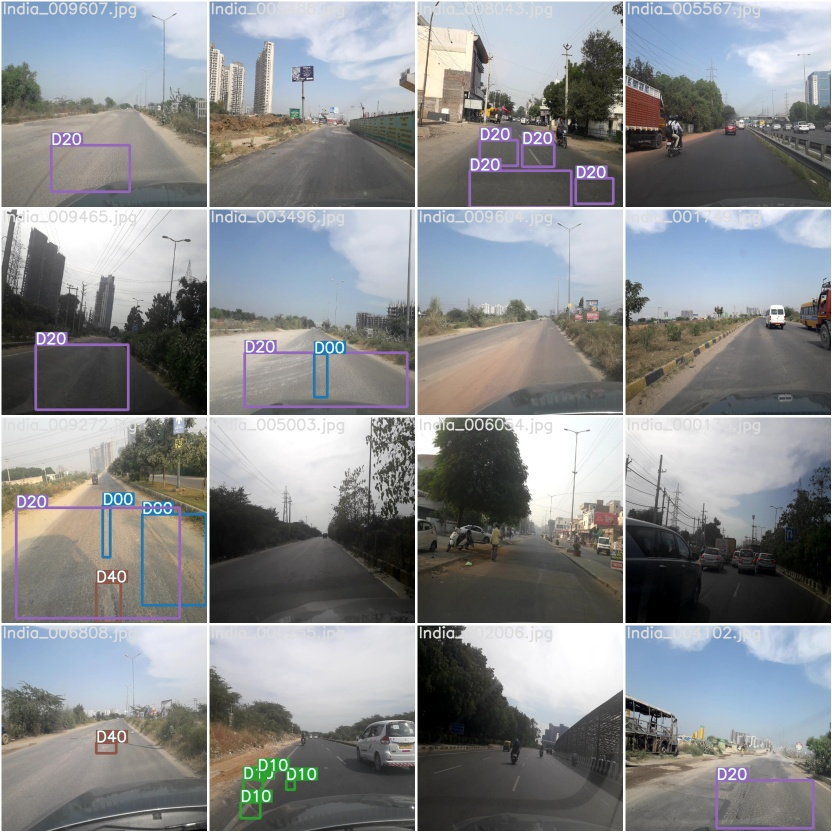

In [ ]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='./test_batch0_gt.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


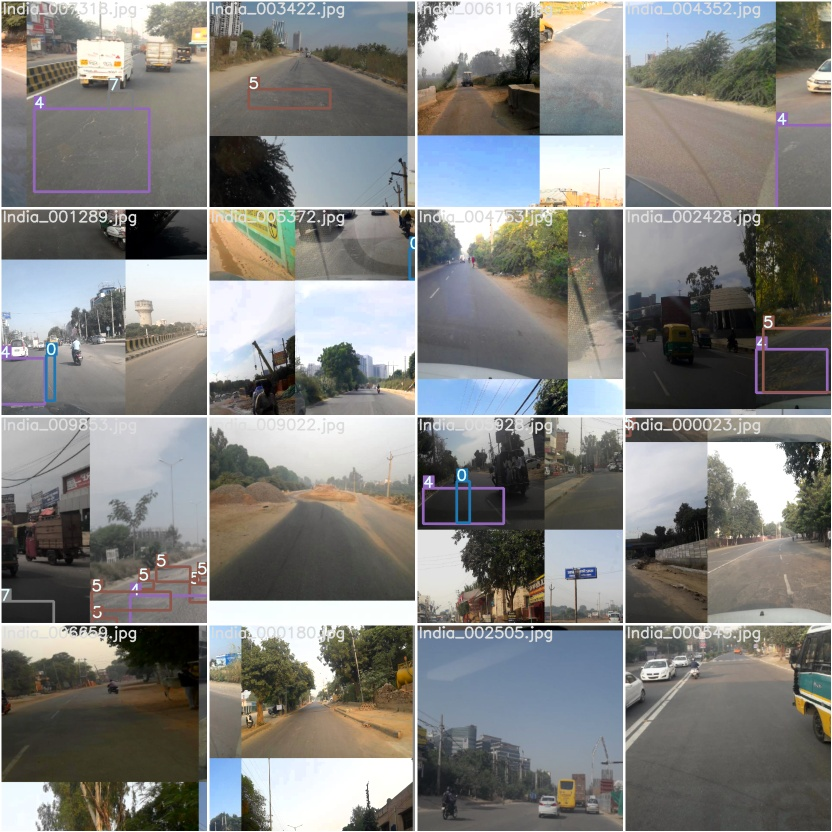

In [ ]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='./train_batch2.jpg', width=900)

In [ ]:
# trained weights are saved by default in our weights folder
%ls weights/

download_weights.sh*  last_yolov5s_results.pt


In [ ]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
%cd /content/yolov5/
!python detect.py --weights weights/last_yolov5s_results.pt --img 416 --conf 0.4 --source /content/val/imgs


/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', img_size=416, iou_thres=0.5, output='inference/output', save_txt=False, source='/content/val/imgs', update=False, view_img=False, weights='weights/last_yolov5s_results.pt')
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15079MB)

image 1/771 /content/val/imgs/India_000035.jpg: 416x416 Done. (0.009s)
image 2/771 /content/val/imgs/India_000042.jpg: 416x416 Done. (0.010s)
image 3/771 /content/val/imgs/India_000053.jpg: 416x416 1 D20s, Done. (0.011s)
image 4/771 /content/val/imgs/India_000069.jpg: 416x416 Done. (0.009s)
image 5/771 /content/val/imgs/India_000081.jpg: 416x416 Done. (0.009s)
image 6/771 /content/val/imgs/India_000086.jpg: 416x416 Done. (0.010s)
image 7/771 /content/val/imgs/India_000092.jpg: 416x416 1 D44s, Done. (0.010s)
image 8/771 /content/val/imgs/India_000103.jpg: 416x416 1 D40s, Done. (0.010s)
image 9/771 /content/val/imgs/India_000107.jpg: 416x

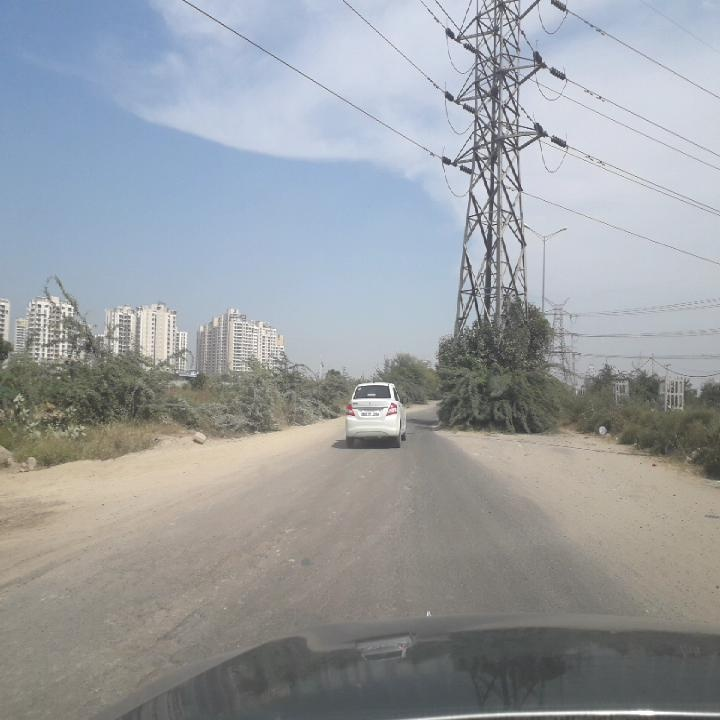

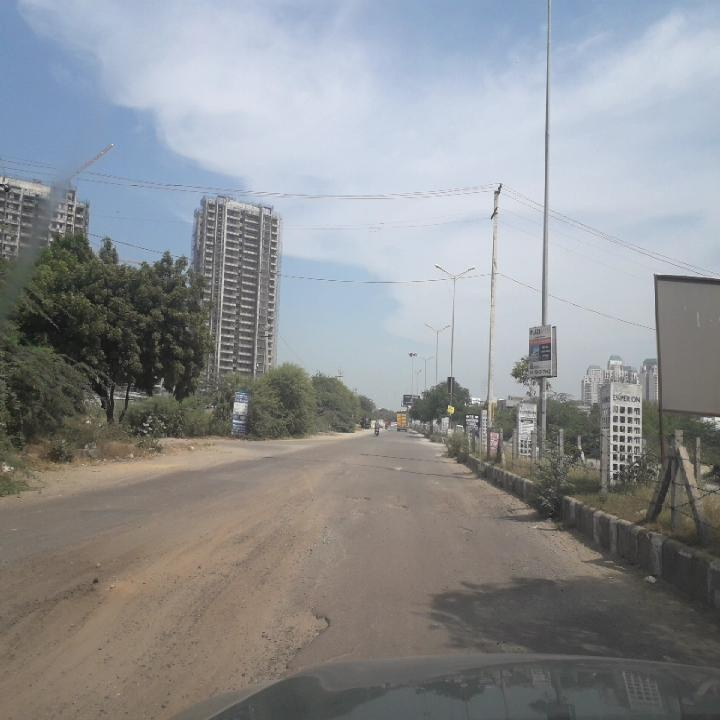

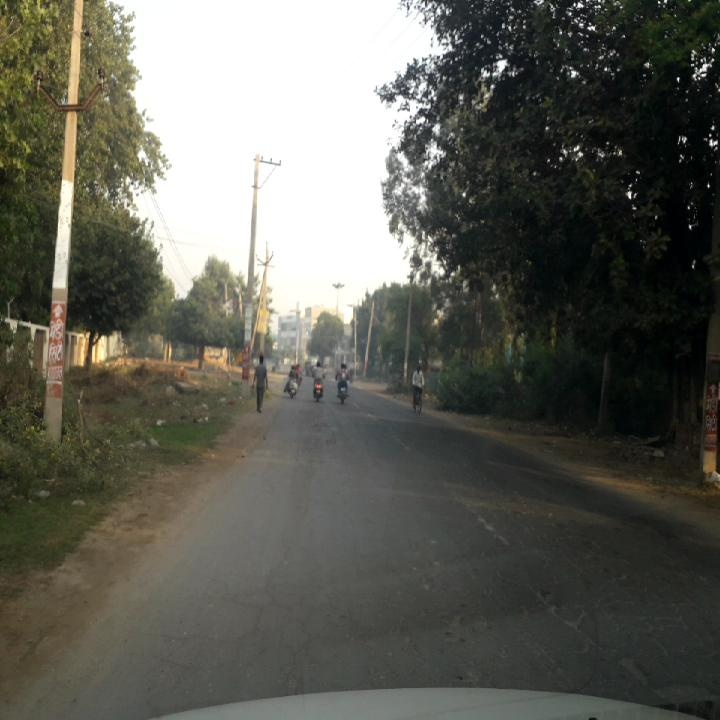

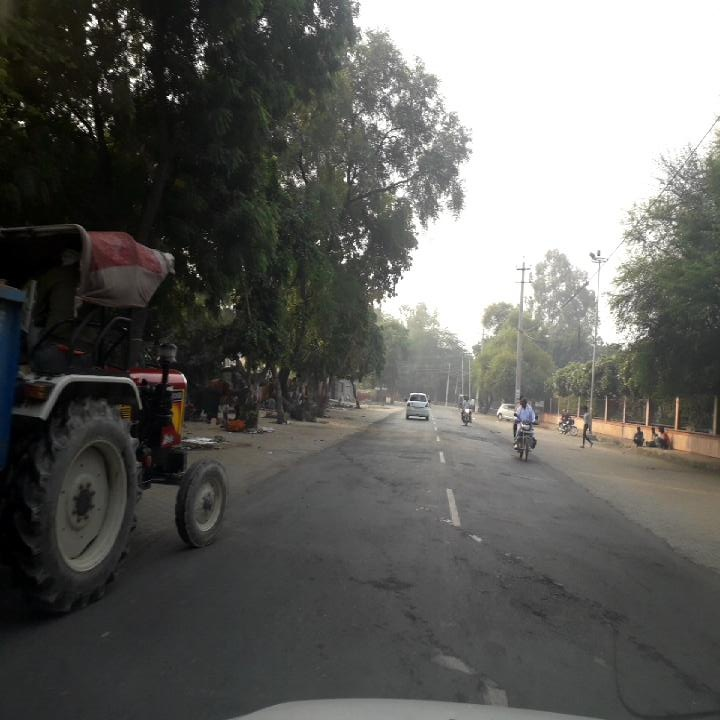

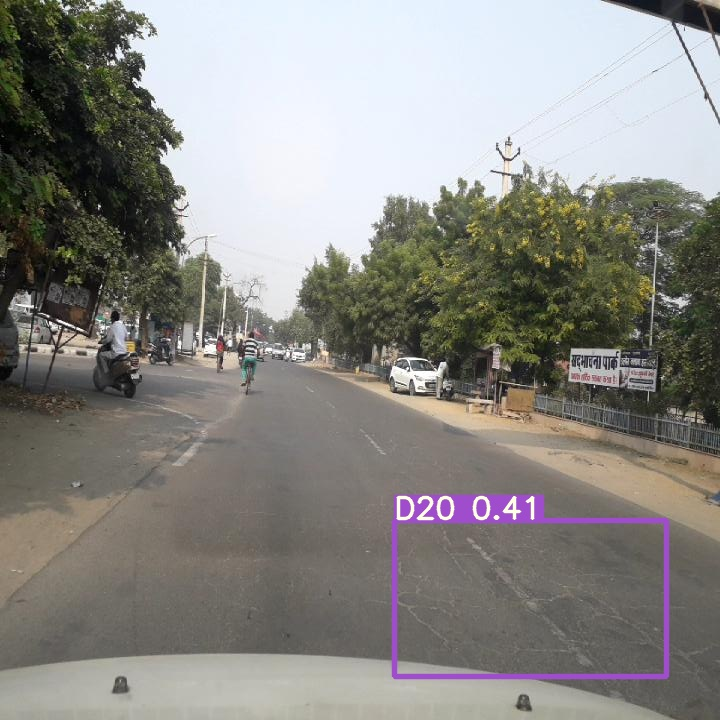

...

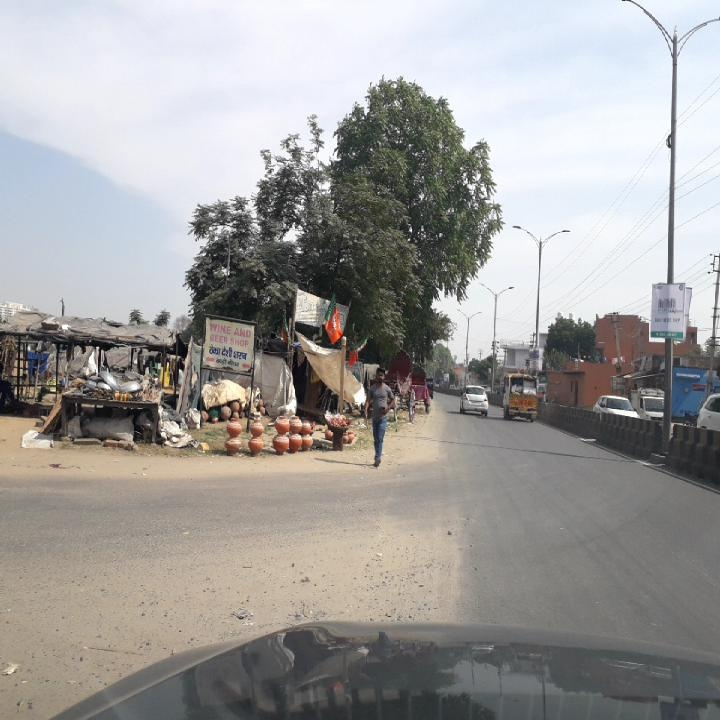

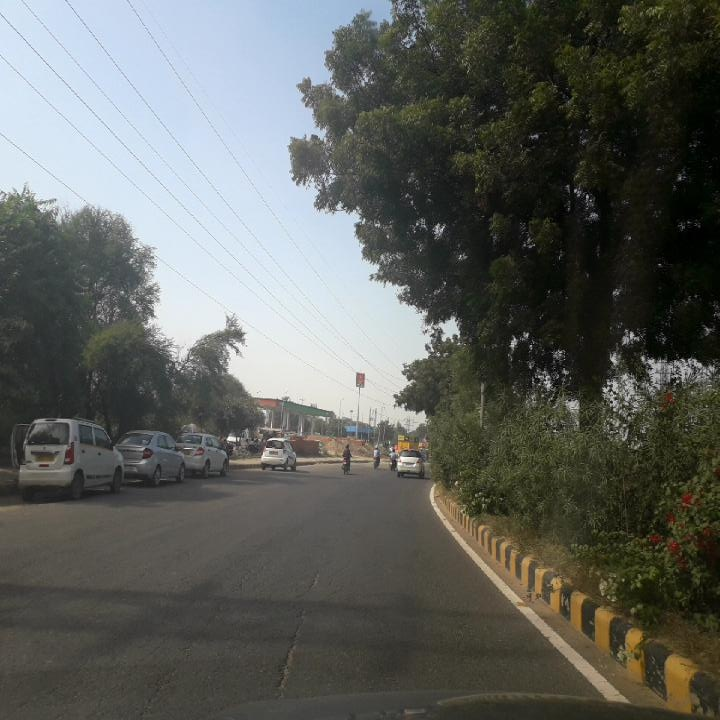

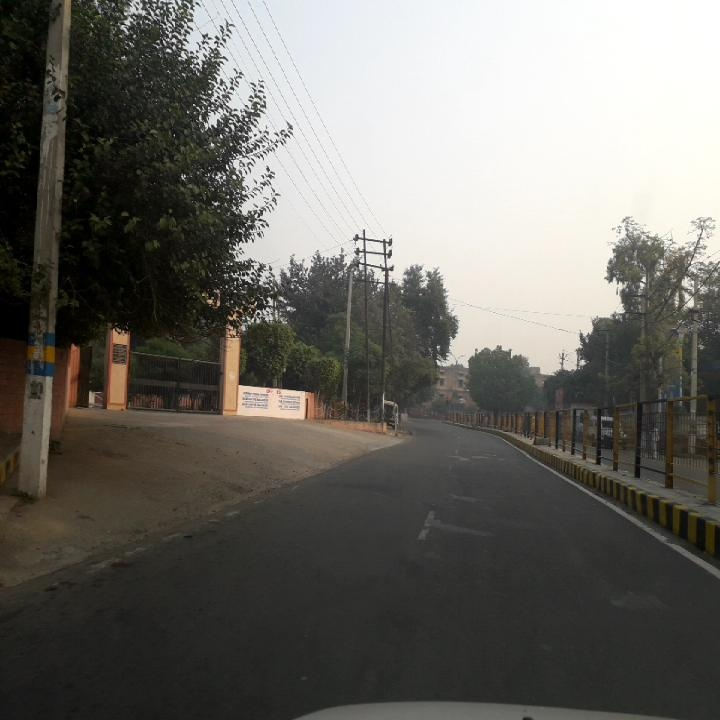

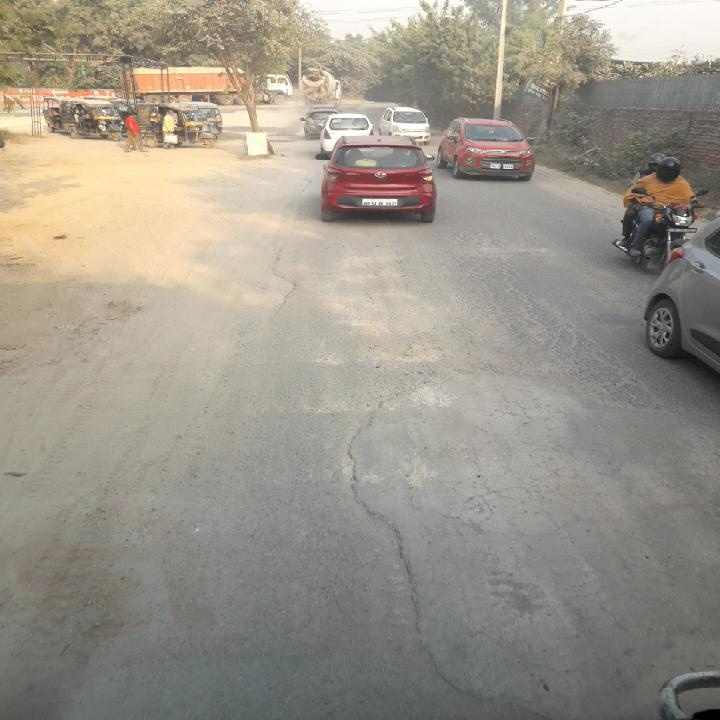

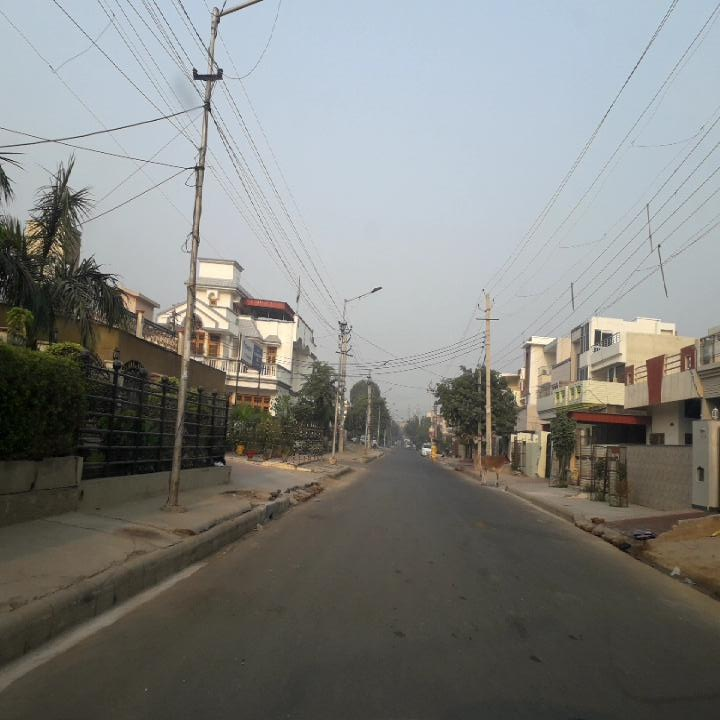

In [ ]:
#display inference on ALL test images
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/inference/output/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [ ]:
%cp /content/yolov5/weights/last_yolov5s_results.pt /content/drive/My\ Drive